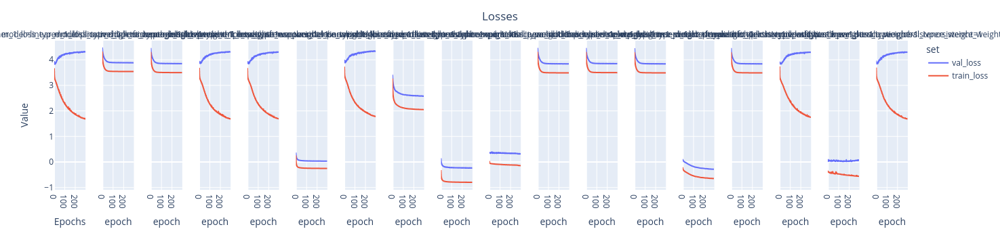

In [57]:
import plotly.express as px
import pandas as pd
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/weather/csv/prova_test_LOSSES.csv')

fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model',width = 2600)
#fig_losses.update_traces(mode="markers+lines", hovertemplate=None)
#fig_losses.update_layout(hovermode="x unified")
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses

In [58]:
tot_losses

,Unnamed: 0,epoch,set,loss,model
0,0,0,val_loss,3.932802,tft_weather_1_loss_type=multiplicative_ivpersi...
1,1,1,val_loss,3.908526,tft_weather_1_loss_type=multiplicative_ivpersi...
2,2,2,val_loss,3.897504,tft_weather_1_loss_type=multiplicative_ivpersi...
3,3,3,val_loss,3.856222,tft_weather_1_loss_type=multiplicative_ivpersi...
4,4,4,val_loss,3.861851,tft_weather_1_loss_type=multiplicative_ivpersi...
...,...,...,...,...,...
10759,10759,294,train_loss,1.695775,tft_weather_1_loss_type=global_ivpersistence_w...
10760,10760,295,train_loss,1.682685,tft_weather_1_loss_type=global_ivpersistence_w...
10761,10761,296,train_loss,1.702509,tft_weather_1_loss_type=global_ivpersistence_w...
10762,10762,297,train_loss,1.682707,tft_weather_1_loss_type=global_ivpersistence_w...


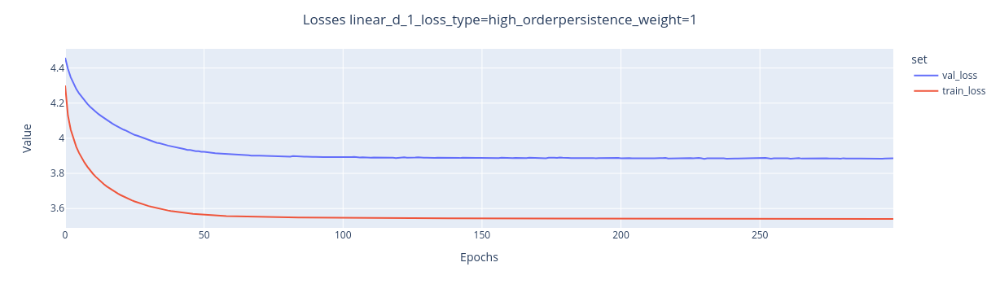

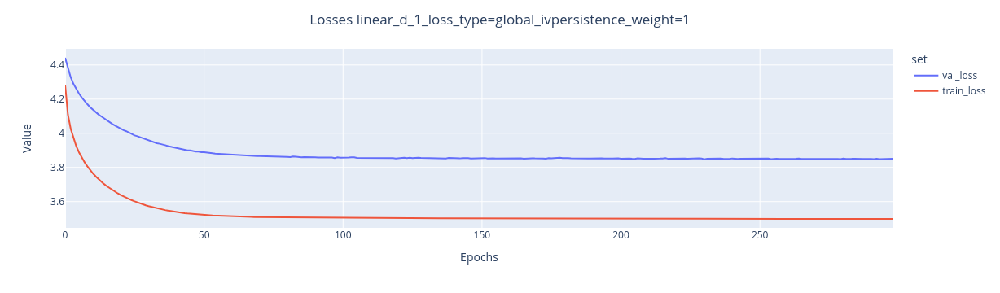

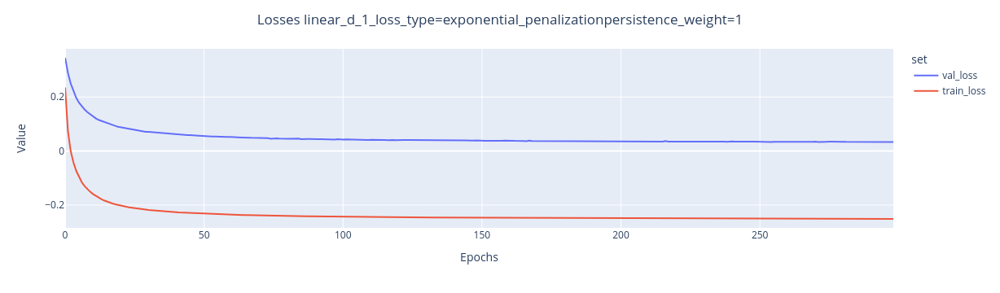

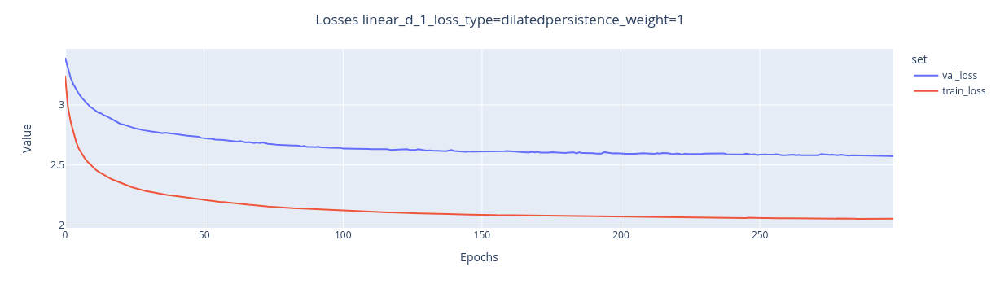

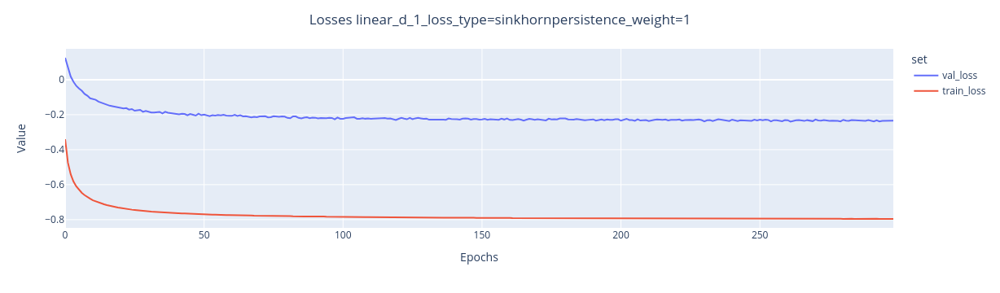

...

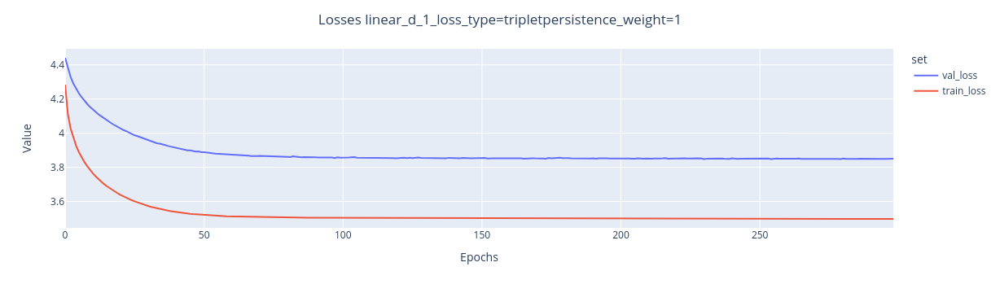

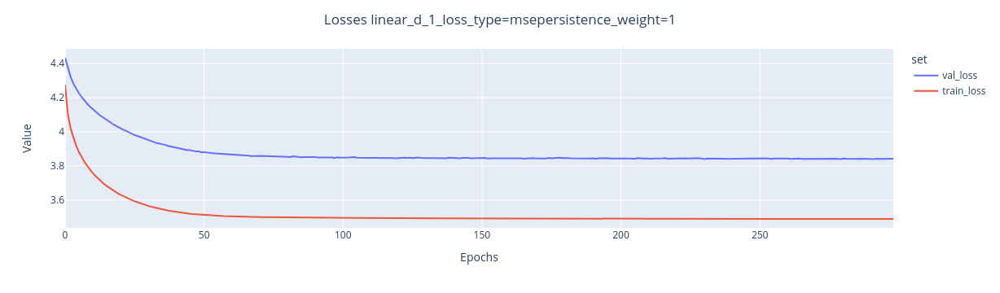

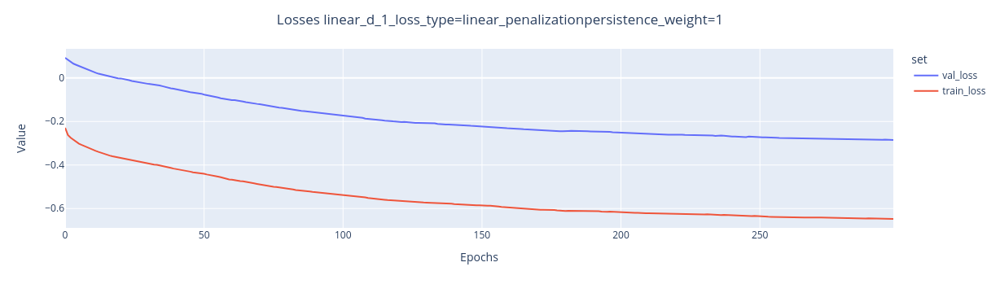

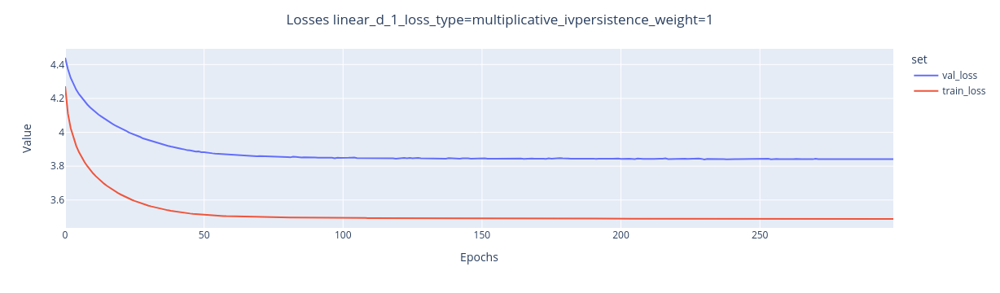

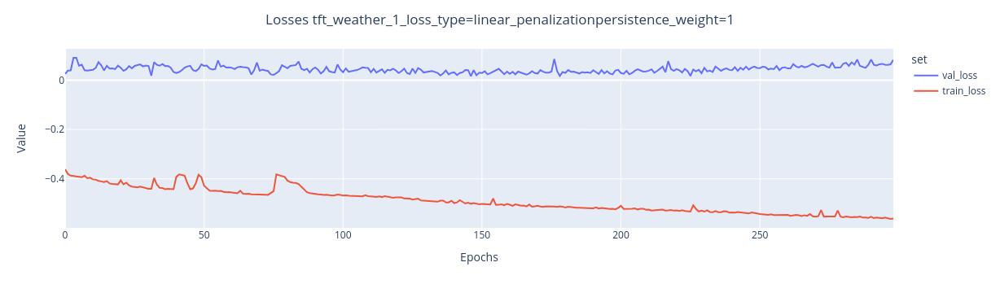

In [92]:
import plotly.express as px
import pandas as pd
import numpy as np
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/weather/csv/prova_test_LOSSES.csv')

for c in tot_losses.model.unique():
    if 'linear' in c:
        fig_losses = px.line(tot_losses[tot_losses.model==c],x = 'epoch',y='loss',color = 'set')
        fig_losses.update_layout(title = {'text':f'Losses '+c, 'x':0.5},
                      xaxis_title={'text':'Epochs'},
                      yaxis_title={'text':'Value'},

                        )
        fig_losses.show()

In [60]:
import plotly.express as px
import pandas as pd
import numpy as np
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/weather/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)
#tot_pred.y_median[tot_pred.model=='d3vae_weather_1'] = tot_pred.y_pred[tot_pred.model=='d3vae_weather_1']
#tot_pred.y_median[tot_pred.model=='persistent_weather_1'] = tot_pred.y_pred[tot_pred.model=='persistent_weather_1']

In [61]:
tot_pred

,Unnamed: 0,lag,time,y,y_low,y_median,y_high,model
0,0,1,2020-11-25 20:20:00,0.604340,0.508893,0.670507,0.849764,tft_weather_1_loss_type=multiplicative_ivpersi...
3949824,3949824,1,2020-11-25 20:20:00,0.604340,0.461638,0.548026,0.654401,linear_d_1_loss_type=msepersistence_weight=1
987456,987456,1,2020-11-25 20:20:00,0.604340,0.518211,0.683090,0.853985,tft_weather_1_loss_type=tripletpersistence_wei...
4278976,4278976,1,2020-11-25 20:20:00,0.604340,0.628869,0.527144,0.628869,linear_d_1_loss_type=linear_penalizationpersis...
3291520,3291520,1,2020-11-25 20:20:00,0.604340,0.464782,0.551520,0.657339,linear_d_1_loss_type=additive_ivpersistence_we...
...,...,...,...,...,...,...,...,...
4278975,4278975,64,2020-12-31 23:50:00,0.466375,-0.674232,-0.176422,0.968270,linear_d_1_loss_type=msepersistence_weight=1
4608127,4608127,64,2020-12-31 23:50:00,0.466375,-0.190479,-0.226611,-0.190479,linear_d_1_loss_type=linear_penalizationpersis...
4937279,4937279,64,2020-12-31 23:50:00,0.466375,-0.683802,-0.182862,0.961254,linear_d_1_loss_type=multiplicative_ivpersiste...
2633215,2633215,64,2020-12-31 23:50:00,0.466375,0.131675,0.438294,0.131675,linear_d_1_loss_type=dilatedpersistence_weight=1


In [62]:
try:
    tot_pred.y_pred[pd.isnull(tot_pred.y_pred)] = tot_pred.y_median[pd.isnull(tot_pred.y_pred)] 
except:
    tot_pred['y_pred'] = tot_pred.y_median.values

In [63]:
tot_pred.lag.max()

64

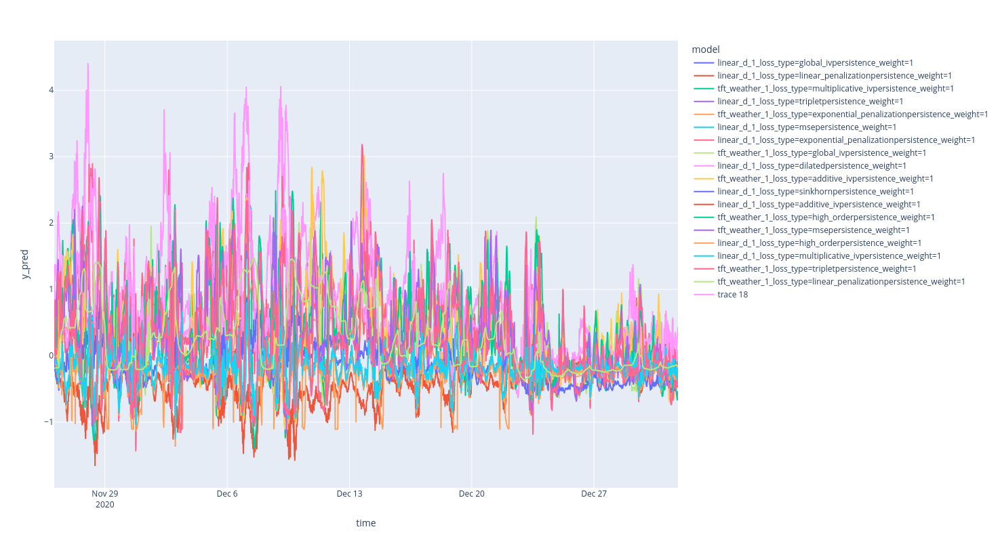

In [64]:
lag=37
fig = px.line(tot_pred[(tot_pred.lag==lag)], x='time', y='y_pred', color='model',height=800)
fig.add_scatter(x = tot_pred[(tot_pred.lag==lag) & (tot_pred.model==tot_pred.model.unique()[0])].time, y=tot_pred[(tot_pred.lag==lag) & (tot_pred.model==tot_pred.model.unique()[0])].y)


In [65]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: 100*np.nanmean(np.abs(x.y-x.y_pred)/x.y)).reset_index().rename(columns={0:'error'}) 


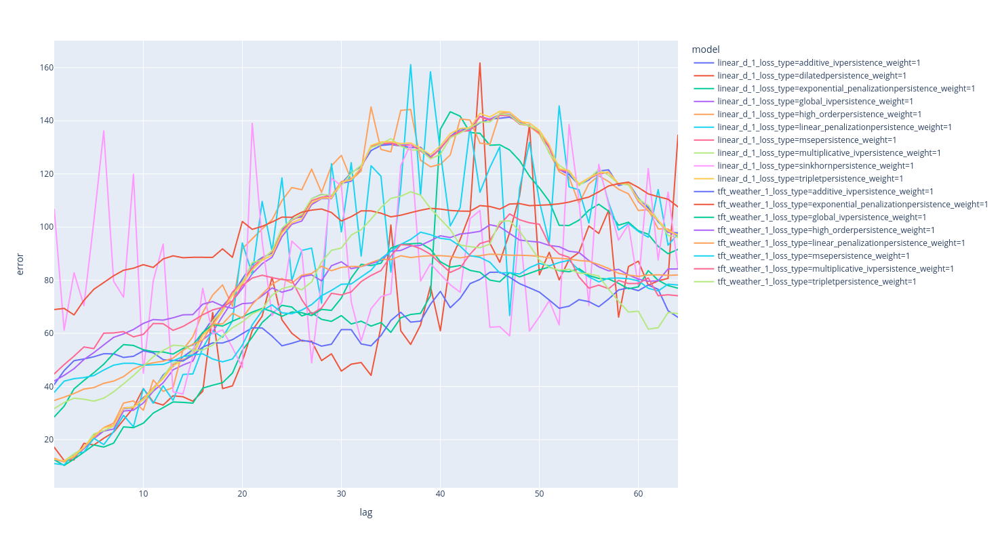

In [66]:
import numpy as np
fig = px.line(error, x='lag', y='error', color='model',height=800)
fig.show() #150--400

In [67]:
tot_pred.time = pd.to_datetime(tot_pred.time)
from datetime import timedelta

tot_pred['prediction_time'] = tot_pred.apply(lambda x: x.time-timedelta(minutes=10*x.lag), axis=1)

In [68]:
tot_pred = tot_pred.reset_index().drop(columns = ['index','Unnamed: 0'])

In [69]:
tot_pred.model.unique()

array(['tft_weather_1_loss_type=multiplicative_ivpersistence_weight=1',
       'linear_d_1_loss_type=msepersistence_weight=1',
       'tft_weather_1_loss_type=tripletpersistence_weight=1',
       'linear_d_1_loss_type=linear_penalizationpersistence_weight=1',
       'linear_d_1_loss_type=additive_ivpersistence_weight=1',
       'linear_d_1_loss_type=multiplicative_ivpersistence_weight=1',
       'tft_weather_1_loss_type=exponential_penalizationpersistence_weight=1',
       'linear_d_1_loss_type=exponential_penalizationpersistence_weight=1',
       'tft_weather_1_loss_type=msepersistence_weight=1',
       'linear_d_1_loss_type=global_ivpersistence_weight=1',
       'tft_weather_1_loss_type=additive_ivpersistence_weight=1',
       'linear_d_1_loss_type=tripletpersistence_weight=1',
       'linear_d_1_loss_type=high_orderpersistence_weight=1',
       'tft_weather_1_loss_type=linear_penalizationpersistence_weight=1',
       'tft_weather_1_loss_type=high_orderpersistence_weight=1',
       '

In [70]:
persistence = tot_pred[(tot_pred.model==tot_pred.model.unique()[0]) & (tot_pred.lag==1) ].drop_duplicates()
persistence = persistence[['prediction_time','y_pred']].rename(columns={'y_pred':'y_prec'}).reset_index()[['prediction_time','y_prec']]


In [73]:
persistence

,prediction_time,y_prec
0,2020-11-25 20:10:00,0.670507
1,2020-11-25 20:20:00,0.793127
2,2020-11-25 20:30:00,0.849243
3,2020-11-25 20:40:00,0.824321
4,2020-11-25 20:50:00,0.798972
...,...,...
5138,2020-12-31 12:30:00,-0.156582
5139,2020-12-31 12:40:00,-0.155613
5140,2020-12-31 12:50:00,-0.125059
5141,2020-12-31 13:00:00,-0.127566


In [74]:
tot_pred_new = pd.merge(tot_pred,persistence,on='prediction_time',how='left')

In [75]:
tot_pred_new = tot_pred_new.sort_values(by=['prediction_time','model','lag'])

In [76]:
tot_pred_new_prec = tot_pred_new[tot_pred_new.model == tot_pred_new.model.values[0]]

In [77]:
tot_pred_new_prec.model = 'persistent'
tot_pred_new_prec.y_pred = tot_pred_new_prec.y_prec
tot_pred_new = pd.concat([tot_pred_new,tot_pred_new_prec],ignore_index=True)

/tmp/ipykernel_45812/1064679427.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_45812/1064679427.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [85]:
WEIGHT = 1
def compute(x,alpha=1):

    try:
        prec = x.y_prec[x.lag==1].values[0]
    except:
        return None,None
    #prec = x.y_pred.values.mean()
    error = np.abs(x.y_pred.values-x.y.values)
    scostamento_persistente = np.abs(x.y_pred.values-prec)


    return error.mean(),scostamento_persistente.mean(),(error*(1+WEIGHT*np.exp(-scostamento_persistente))).mean()

def compute_fun(x):
    error, scostamento, tot_error = compute(x)
    return pd.Series({'error':error if error is not None else np.nan, 
                      'error_p':scostamento if scostamento is not None else np.nan,
                      'error_tot':tot_error if tot_error is not None else np.nan})

In [86]:
agg = tot_pred_new.groupby(['prediction_time','model']).apply(compute_fun).reset_index().dropna()


In [88]:
agg.groupby('model')[['error','error_p','error_tot']].mean().reset_index().sort_values(by='error_tot')

,model,error,error_p,error_tot
1,linear_d_1_loss_type=dilatedpersistence_weight=1,0.600478,0.513739,3.863386
2,linear_d_1_loss_type=exponential_penalizationp...,0.627691,0.536136,3.938766
5,linear_d_1_loss_type=linear_penalizationpersis...,0.795505,0.673529,4.316248
3,linear_d_1_loss_type=global_ivpersistence_weig...,0.815112,0.690949,4.382948
9,linear_d_1_loss_type=tripletpersistence_weight=1,0.820624,0.693153,4.412463
6,linear_d_1_loss_type=msepersistence_weight=1,0.822009,0.694410,4.414841
7,linear_d_1_loss_type=multiplicative_ivpersiste...,0.822316,0.694601,4.415866
0,linear_d_1_loss_type=additive_ivpersistence_we...,0.822734,0.694981,4.416356
4,linear_d_1_loss_type=high_orderpersistence_wei...,0.829975,0.702369,4.433428
11,tft_weather_1_loss_type=additive_ivpersistence...,0.740307,0.582929,4.443575


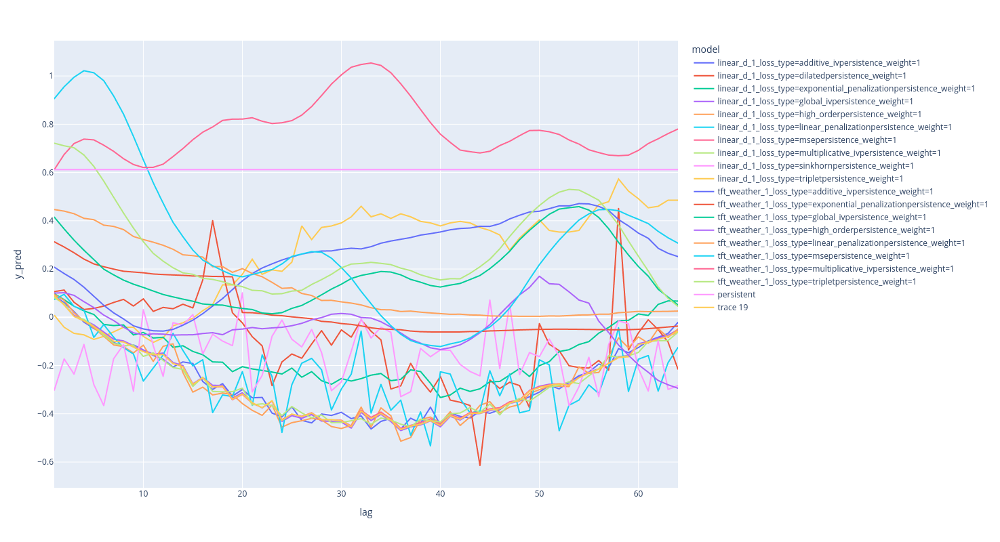

In [82]:
#27-11-2020
date  ='2020-12-19 13:20:00'
subset = tot_pred_new[(tot_pred_new.prediction_time==date)]
fig = px.line(subset, x='lag', y='y_pred', color='model',height=800)
fig.add_scatter(x = subset.lag[subset.model==subset.model.unique()[0]], y=subset.y[subset.model==subset.model.unique()[0]])

fig.show()

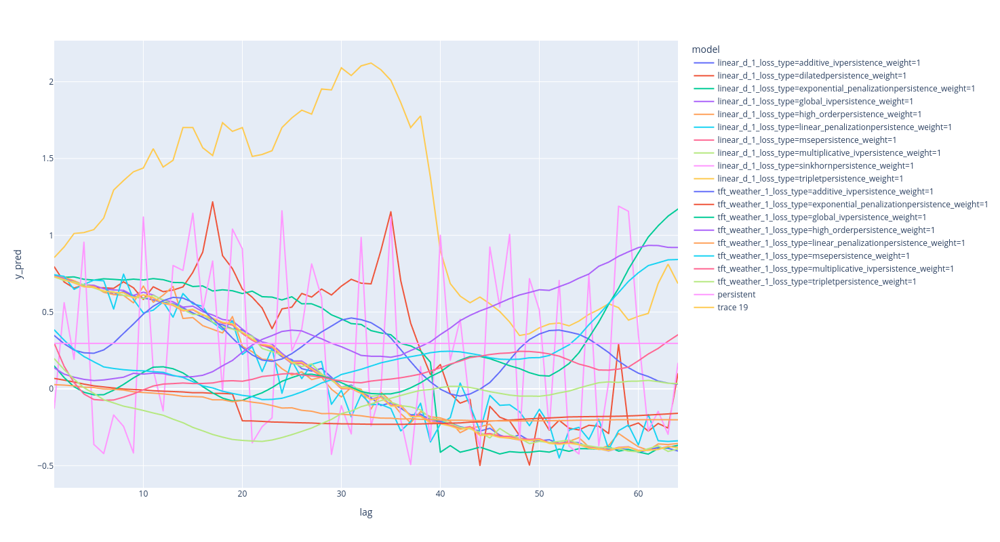

In [83]:
date  ='2020-12-08 05:30:00'
subset = tot_pred_new[(tot_pred_new.prediction_time==date)]
fig = px.line(subset, x='lag', y='y_pred', color='model',height=800)
fig.add_scatter(x = subset.lag[subset.model==subset.model.unique()[0]], y=subset.y[subset.model==subset.model.unique()[0]])

fig.show()

In [118]:

class SinkhornDistance():
    r"""
    Given two empirical measures each with :math:`P_1` locations
    :math:`x\in\mathbb{R}^{D_1}` and :math:`P_2` locations :math:`y\in\mathbb{R}^{D_2}`,
    outputs an approximation of the regularized OT cost for point clouds.

    Args:
        eps (float): regularization coefficient
        max_iter (int): maximum number of Sinkhorn iterations
        reduction (string, optional): Specifies the reduction to apply to the output:
            'none' | 'mean' | 'sum'. 'none': no reduction will be applied,
            'mean': the sum of the output will be divided by the number of
            elements in the output, 'sum': the output will be summed. Default: 'none'

    Shape:
        - Input: :math:`(N, P_1, D_1)`, :math:`(N, P_2, D_2)`
        - Output: :math:`(N)` or :math:`()`, depending on `reduction`
    """
    def __init__(self, eps, max_iter, reduction='none'):
        super(SinkhornDistance, self).__init__()
        self.eps = eps
        self.max_iter = max_iter
        self.reduction = reduction

    def compute(self, x, y):
        # The Sinkhorn algorithm takes as input three variables :
        C = self._cost_matrix(x, y).to(x.device)  # Wasserstein cost function
        x_points = x.shape[-2]
        y_points = y.shape[-2]
        if x.dim() == 2:
            batch_size = 1
        else:
            batch_size = x.shape[0]

        # both marginals are fixed with equal weights
        mu = torch.empty(batch_size, x_points, dtype=torch.float,
                         requires_grad=False).fill_(1.0 / x_points).squeeze().to(x.device)
        nu = torch.empty(batch_size, y_points, dtype=torch.float,
                         requires_grad=False).fill_(1.0 / y_points).squeeze().to(x.device)

        u = torch.zeros_like(mu).to(x.device)
        v = torch.zeros_like(nu).to(x.device)
        # To check if algorithm terminates because of threshold
        # or max iterations reached
        actual_nits = 0
        # Stopping criterion
        thresh = 1e-1

        # Sinkhorn iterations
        for i in range(self.max_iter):
            u1 = u  # useful to check the update
            u = self.eps * (torch.log(mu+1e-8) - torch.logsumexp(self.M(C, u, v), dim=-1)) + u
            v = self.eps * (torch.log(nu+1e-8) - torch.logsumexp(self.M(C, u, v).transpose(-2, -1), dim=-1)) + v
            err = (u - u1).abs().sum(-1).mean()

            actual_nits += 1
            if err.item() < thresh:
                break

        U, V = u, v
        # Transport plan pi = diag(a)*K*diag(b)
        pi = torch.exp(self.M(C, U, V))
        # Sinkhorn distance
        cost = torch.sum(pi * C, dim=(-2, -1))

        if self.reduction == 'mean':
            cost = cost.mean()
        elif self.reduction == 'sum':
            cost = cost.sum()

        return cost#, pi, C

    def M(self, C, u, v):
        "Modified cost for logarithmic updates"
        "$M_{ij} = (-c_{ij} + u_i + v_j) / \epsilon$"
        return (-C + u.unsqueeze(-1) + v.unsqueeze(-2)) / self.eps

    @staticmethod
    def _cost_matrix(x, y, p=2):
        "Returns the matrix of $|x_i-y_j|^p$."
        x_col = x.unsqueeze(-2)
        y_lin = y.unsqueeze(-3)
        C = torch.sum((torch.abs(x_col - y_lin)) ** p, -1)
        return C

    @staticmethod
    def ave(u, u1, tau):
        "Barycenter subroutine, used by kinetic acceleration through extrapolation."
        return tau * u + (1 - tau) * u1

In [77]:
dd = list(tot_pred_new.prediction_time.unique())

In [78]:
import random
dates = random.sample(dd,64)

In [153]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler().fit(tot_pred_new[tot_pred_new.model=='persistent_persistent_1_loss_type=linear'].y.values.reshape(-1,1))

In [154]:
tot_pred_new.y = scaler.transform(tot_pred_new.y.values.reshape(-1,1)).flatten()

In [155]:
tot_pred_new.y_pred = scaler.transform(tot_pred_new.y_pred.values.reshape(-1,1)).flatten()

In [156]:
date  ='2020-12-08 17:30:00'
models = 'linear_n_1_loss_type=linear'
model_y=[]
persistent = 'persistent_persistent_1_loss_type=linear'
persistent_y = []
real_y =[]
for d in dates:
    model_y.append(tot_pred_new[(tot_pred_new.prediction_time==d) & (tot_pred_new.model==models)].y_pred.values)
    persistent_y.append(tot_pred_new[(tot_pred_new.prediction_time==d) & (tot_pred_new.model==persistent)].y_pred.values)
    real_y.append(tot_pred_new[(tot_pred_new.prediction_time==d) & (tot_pred_new.model==models)].y.values)

In [157]:
import torch
torch.tensor(np.vstack(model_y))

tensor([[ 0.6100,  0.5917,  0.5716,  ...,  0.4808,  0.4801,  0.4802],
        [-0.0272, -0.0212, -0.0210,  ...,  0.0277,  0.0321,  0.0318],
        [ 1.9433,  1.9799,  2.0050,  ...,  2.0066,  1.9900,  1.9555],
        ...,
        [ 1.0910,  1.1224,  1.1474,  ...,  1.5262,  1.5605,  1.5775],
        [ 0.0166,  0.0175,  0.0137,  ...,  0.0216,  0.0227,  0.0192],
        [-0.6835, -0.6833, -0.6868,  ..., -0.7659, -0.7761, -0.7873]],
       dtype=torch.float64)

In [181]:
sink = SinkhornDistance(eps=0.1, max_iter=100, reduction='mean')

In [182]:
sink.compute(torch.tensor(np.vstack(model_y)),torch.tensor(np.vstack(real_y)))#168

tensor(0.9021, dtype=torch.float64)

In [183]:
sink.compute(torch.tensor(np.vstack(model_y)),torch.tensor(np.vstack(persistent_y)))#40

tensor(0.3329, dtype=torch.float64)

In [184]:
sink.compute(torch.tensor(np.vstack(persistent_y)),torch.tensor(np.vstack(real_y)))#205

tensor(1.0967, dtype=torch.float64)

In [187]:
sink.compute(torch.tensor(np.vstack(model_y)),torch.tensor(np.vstack(real_y)))+sink.compute(torch.tensor(np.vstack(model_y)),torch.tensor(np.vstack(real_y)))/(0.001+sink.compute(torch.tensor(np.vstack(model_y)),torch.tensor(np.vstack(persistent_y))))

tensor(3.6038, dtype=torch.float64)

In [188]:
sink.compute(torch.tensor(np.vstack(model_y)),torch.tensor(np.vstack(real_y)))+sink.compute(torch.tensor(np.vstack(persistent_y)),torch.tensor(np.vstack(real_y)))/(0.001+sink.compute(torch.tensor(np.vstack(persistent_y)),torch.tensor(np.vstack(persistent_y))))

tensor(30.5722, dtype=torch.float64)

In [75]:
triplet_loss = torch.nn.TripletMarginLoss(margin=1.0, p=2)

anchor = torch.tensor(np.vstack(model_y))
positive = torch.tensor(np.vstack(real_y))
negative = torch.tensor(np.vstack(persistent_y))
triplet_loss(anchor, positive, negative)

tensor(23.1787, dtype=torch.float64)

In [9]:
a = pd.DataFrame({'a':[1,2,3,4,1,2,1,3,4],'b':[1,1,1,1,2,2,3,3,3]})

In [10]:
a

,a,b
0,1,1
1,2,1
2,3,1
3,4,1
4,1,2
5,2,2
6,1,3
7,3,3
8,4,3


In [15]:
empty = pd.DataFrame({'a':[1,2,3,4],'b':None})
empty

,a,b
0,1,None
1,2,None
2,3,None
3,4,None


In [14]:
empty.merge(a, how='left')

ValueError: You are trying to merge on object and int64 columns. If you wish to proceed you should use pd.concat

In [20]:
x = tot_pred
freq = timedelta(minutes=10)
groups = 'lag'

In [29]:
_min = x.groupby(groups).time.min().reset_index()
_max = x.groupby(groups).time.max().reset_index()
empty = []
for c in x[groups].unique():
    empty.append(pd.DataFrame({groups:c,'time':pd.date_range(_min.time[_min[groups]==c].values[0],_max.time[_max[groups]==c].values[0],freq=freq)}))

In [28]:
_min.time[_min[groups]==c]


0   2020-11-25 12:20:00
Name: time, dtype: datetime64[ns]

In [31]:
empty = pd.concat(empty,ignore_index=True)

In [32]:
empty

,lag,time
0,1,2020-11-25 12:20:00
1,1,2020-11-25 12:30:00
2,1,2020-11-25 12:40:00
3,1,2020-11-25 12:50:00
4,1,2020-11-25 13:00:00
...,...,...
83819,16,2020-12-31 23:10:00
83820,16,2020-12-31 23:20:00
83821,16,2020-12-31 23:30:00
83822,16,2020-12-31 23:40:00


In [39]:
ls = x.groupby(groups).time.count().reset_index()

In [38]:
ls =x[x.lag==14].iloc[0:100]

,Unnamed: 0,lag,time,y,y_low,y_median,y_high,model,y_pred,prediction_time
738699,738699,14,2020-11-25 14:30:00,424.8,424.038849,426.770508,429.519562,linear_n_1,426.770508,2020-11-25 12:10:00
151931,151931,14,2020-11-25 14:30:00,424.8,422.056152,424.769135,427.889648,linear_d_1,424.769135,2020-11-25 12:10:00
990171,990171,14,2020-11-25 14:30:00,424.8,418.154266,424.314056,429.328003,rnn_gru_1_loss_type=high_orderpersistence_weig...,424.314056,2020-11-25 12:10:00
654875,654875,14,2020-11-25 14:30:00,424.8,NaN,NaN,NaN,crossformer_test_1,423.567570,2020-11-25 12:10:00
822523,822523,14,2020-11-25 14:30:00,424.8,427.286566,427.933333,428.580100,vva_test_1,427.933333,2020-11-25 12:10:00
...,...,...,...,...,...,...,...,...,...,...
151938,151938,14,2020-11-25 15:40:00,424.5,420.329987,423.202484,426.485474,linear_d_1,423.202484,2020-11-25 13:20:00
571058,571058,14,2020-11-25 15:40:00,424.5,NaN,NaN,NaN,informer_test_1,421.426850,2020-11-25 13:20:00
654882,654882,14,2020-11-25 15:40:00,424.5,NaN,NaN,NaN,crossformer_test_1,424.806640,2020-11-25 13:20:00
738706,738706,14,2020-11-25 15:40:00,424.5,421.909821,424.857819,427.873230,linear_n_1,424.857819,2020-11-25 13:20:00


In [41]:
ls[ls['lag']==13].time.values[0]

68107

In [37]:
x = np.array(range(20))/20

In [38]:
np.mean(x)

0.4749999999999999

In [50]:
np.var(x)

0.08312499999999999

In [42]:
from scipy.stats import skew

In [43]:
skew(x)

7.238236489080421e-16

In [46]:
def standardize_momentum(x,order):
    mean = np.mean(x)
    num = 0
    den = 0
    for i in range(len(x)):
        num+=(x[i]-mean)**(order)
        den+=(x[i]-mean)**(order-1)
    num=num/len(x)
    den=den/len(x)
    den = den**(order*1.0/order-1)
    return num/den

In [52]:
standardize_momentum(x,4)


0.012396015624999998

In [48]:
x

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95])

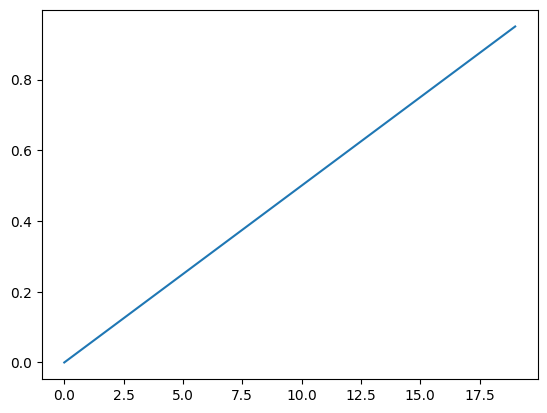

In [54]:
import matplotlib.pyplot as plt
plt.plot(x)
plt.plot(

In [55]:
x

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95])

In [56]:
y = np.array([0.5]*len(x))

In [60]:
z = (x+y)/2

In [62]:
np.mean((x-y)**2)

0.08375

In [63]:
np.mean((x-z)**2)

0.0209375